# Cumulative and component impacts of the human footprint on remotely

sensed biodiversity indicators using dissimilarity to high integrity reference states.

Evan Muise [](https://orcid.org/0000-0003-3404-3220) (Department of Forest Resource Management, University of British Columbia, Vancouver, British Columbia, Canada)  
Nicholas Coops [](https://orcid.org/0000-0002-7859-8394) (Department of Forest Resource Management, University of British Columbia, Vancouver, British Columbia, Canada)  
Txomin Hermosilla [](https://orcid.org/0000-0002-5445-0360) (Canadian Forest Service (Pacific Forestry Centre), Natural Resources Canada, Victoria, British Columbia, Canada)  
Christopher Mulverhill [](https://orcid.org/0000-0002-2422-7432) (Department of Forest Resource Management, University of British Columbia, Vancouver, British Columbia, Canada)  
Cole Burton [](https://orcid.org/0000-0002-8799-3847) (Department of Forest Resource Management, University of British Columbia, Vancouver, British Columbia, Canada)  
Stephen Ban [](https://orcid.org/0000-0001-5033-3370) (BC Parks, Government of British Columbia, Victoria, British Columbia, Canada)  
February 21, 2025

In [ ]:
# package citation
.to.cite <- c("sgsR",  "terra", "sf", "rstatix", "tidyterra")

pkgs <- unique(c(.to.cite, .packages()))
knitr::write_bib(pkgs, file = "packages.bib")

**Abstract**

Forests with high ecological integrity are fundamental for biodiversity conservation, and provide integral ecosystem services. These forests have natural or near-natural ecosystem structure, function, and composition. Anthropogenic pressures such as habitat loss, overexploitation of natural resources, and land use changes are leading to the degradation or loss of high-integrity forests. As a result, assessing forest integrity over large areas is increasingly important for a range of conservation initiatives. In this study, we used remote sensing-derived forest structural and functioning metrics alongside a high-quality reference state to calculate ecological dissimilarity as a proxy for ecological integrity. We examined stand-level integrity and focused on forest structural attributes such as canopy height, cover, complexity, and biomass, as well as the Dynamic Habitat Indices, which summarize annual energy availability relevant for biodiversity. We further refined our reference states by using coarsened exact matching to ensure our comparisons were drawn from suitable protected analogs. We applied these methods to Vancouver Island, Canada, where we assessed the distance, in structural and functional space, to matched high-integrity forests found in the island’s oldest and largest protected area. We also assessed how individual and cumulative anthropogenic pressure affect the ecological integrity of forests on the island. We found that mean forest structural dissimilarity increased from 0.11 to 0.24 under high levels of anthropogenic pressure (ANOVA; p \< 0.01), while functional dissimilarity was not impacted by any anthropogenic pressure (ANOVA; p \> 0.05). This indicates that anthropogenic pressures were observed to directly influence forest canopy characteristics, and less so energy availability. For individual pressures, we found that built environments, harvesting, and population density influenced structural dissimilarity (ANOVA; p \< 0.05), while roads did not influence structural dissimilarity (ANOVA; p \> 0.05). These methods for identifying high-integrity forests can be used to identify areas to be prioritized for protection or restoration, which in turn progresses towards the Kunming-Montreal Global Biodiversity Framework’s goal of 30% of all ecosystems protected, while focusing on high-integrity ecosystems.

# Introduction

Forests contain large amounts of biodiversity \[@myers1988; @cardinale2012\] and provide important ecosystem services, including nutrient cycling, carbon sequestration, timber, recreation areas, among others \[@thompson2009\]. However, the ongoing impact of anthropogenic pressures such as climate change, overexploitation of natural resources, and invasive species are leading to forest degradation and reducing the ability of forested ecosystems to provide these services \[@grantham2020\]. Therefore it is imperative to maintain and conserve forests that have high ecological integrity, as defined by natural or near-natural levels of forest structure, function, and composition \[@hansen2021\]. The importance of high-integrity ecosystems has led to a general call to move beyond simple quantification of ecosystem or forest extent in conservation strategies to other metrics which additionally consider the integrity of the conserved ecosystem \[@muise2022; @hansen2020; @ferrier2024\]. In December 2022, the Kunming-Montreal Global Biodiversity Framework (GBF) was adopted with the goal of restoring and safeguarding global biodiversity \[@reporto2023\]. Targets within this framework include restoring 30% of all degraded ecosystems, protecting 30% of the Earth’s terrestrial, inland water, and marine areas by 2030, and achieving no loss of high biodiversity importance areas, especially high ecological integrity ecosystems \[@reporto2023\]. However, there are currently no spatially explicitly assessments of ecological integrity available at broad spatial scales, making progress towards these goals difficult to quantify.

Assessing ecological integrity requires a comprehensive evaluation of ecosystem structure, function, and composition, which can be effectively achieved using remote sensing-derived indicators \[@skidmore2021; @pereira2013\]. Advances in remote sensing technologies such as light detection and ranging (lidar) allow accurate measurement of forest structural attributes, including canopy height, canopy cover, vertical complexity, and biomass \[@valbuena2020; @bergen2009\]. These indicators of forest structure can provide critical insights into habitat quality and the ability of ecosystems to support biodiversity \[@macarthur1961; @guo2017; @gao2014\], and are rapidly becoming available at national scales through advanced modelling techniques \[@matasci2018; @matasci2018a\]. Additionally, optical remote sensing facilitates the monitoring of functional processes, such as photosynthetic activity and forest phenology, through the use of vegtetation indices \[@pettorelli2018\]. By integrating these indices over the course of the year, it is possible to assess energy availability, seasonality, and stress on an ecosystem \[@radeloff2019; @razenkova2023\], which have also been shown to be linked to biodiversity across a range of taxa \[@coops2019; @andrew2024; @razenkova2022; @coops2009ecoinfo\]. Furthermore, structural and functional indicators have been shown to have low information overlap \[@muise2024\], making the use of satellite-derived structural and functional indicators suitable for assessing ecological integrity across regions, countries, or even continents by comparing them to an appropriate reference state \[@hansen2020; @grantham2020\].

Another key aspect of assessing ecological integrity are reference states, typically defined as examples of an ecosystem whichhas not experienced major anthropogenic disturbance \[@hansen2020\]. These reference states represent the baseline conditions of ecosystems and serve as a benchmark for assessing ecological health and guiding protection and restoration efforts \[@nielsen2007\]. Various methods have been proposed for identifying reference states, including protected areas \[@arcese1997\], historical \[@mcnellie2020\], and empirical reference states \[@ferraro2009; @nielsen2007\]. Protected area reference states are commonly used because conservation efforts aim to mitigate anthropogenic pressures within protected areas \[@geldmann2019\], and the bias for protected areas to be placed in areas with low amounts of anthropogenic pressures \[@joppa2009\] and less productive land cover types \[@muise2022\]. Due to these biases in protected area placement, it is necessary to account for differences in environmental conditions and land cover types when using them as a reference state. This is typically done using counterfactual methods \[@ferraro2009\], such as coarsened exact matching \[@iacus2012\]. Using these methods, it becomes possible to identify an appropriate reference state for an entire region by comparing it to protected areas without anthropogenic pressure under similar environmental conditions.

Building on this foundation, the objective of this study was to develop and implement a spatially explicit framework for assessing ecological integrity at regional to continental scales using remote sensing data. Specifically, we aimed to (1) integrate satellite-derived indicators of forest structure and function with robust counterfactual methods to establish reference states, (2) quantify deviations from these reference states as a measure of ecological degradation, and (3) demonstrate the utility of this method over a regional study area. This study addresses a critical gap in the operationalization of global biodiversity targets, such as those outlined in the GBF, by providing a scalable, reproducible approach to monitor and guide conservation and restoration efforts. By enabling the identification of areas with high ecological integrity and those most in need of restoration, this study has the potential to directly inform policy and support more effective biodiversity conservation strategies.

# Methods

We propose a novel, data-driven approach to identify high-integrity forests based on various satellite derived metrics of ecosystem condition. First, we account for differences in environmental conditions by implementing a coarsened exact matching approach \[@iacus2012\]. This ensures that ecosystems must be similar to their protected counterparts (i.e., a forest in a valley bottom and a mountain top would not be compared to one another), which accounts for biases in protected area placement \[@muise2022; @joppa2009\]. We use the sigma dissimilarity metric \[@mahony2017\] to calculate the similarity to high-integrity, undisturbed, forests in both structural and functional space as a metric of ecological integrity (@fig-flow). Finally, we validate our results by assessing the impact anthropogenic pressures \[@hirsh-pearson2022\] on our similarity metric, with the hypothesis that increased anthropogenic pressures should increase ecological dissimilarity.

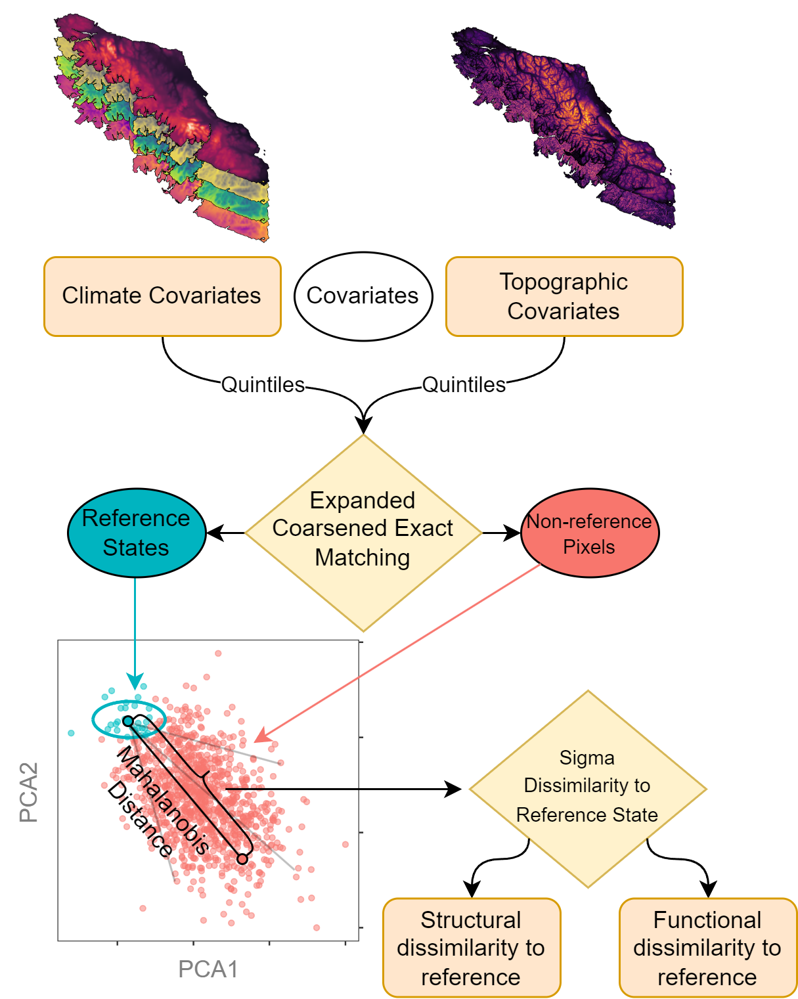

In [ ]:
knitr::include_graphics("E:/Sync/Masters/04_vi_pristine/figures/flow.drawio.png")

## Study Area

We focus on the forested areas of Vancouver Island, British Columbia, Canada (@fig-study). Vancouver Island has approximately 31,285 km<sup>2</sup> of land area, of which 79.5% is forested. Climate is temperate maritime, with mild, wet winters, and cool, dry summers. Vancouver Island is divided in four zones as defined by British Columbia’s biogeoclimatic ecosystem classification (BEC) framework \[@pojar1987\], Coastal Western Hemlock, Mountain Hemlock, Coastal Douglas-fir, and Coastal Mountain-heather Alpine, which are broadly delineated based on climax vegetation species, soil, climate, and elevation. We limit our analyses to Coastal Western Hemlock, Mountain Hemlock, and Coastal Mountain-heather Alpine, as the Coastal Douglas-fir ecosystem is not present within our reference state. The dominant tree species on Vancouver Island are Douglas-fir (*Pseudotsuga menziesii*), western red cedar (*Thuja plicata*), western hemlock (*Tsuga heterophylla*), yellow cedar (*Chamaecyparis nootkatensis*), and Sitka spruce (*Picea sitchensis*) \[@burns1990\]. Fires on Vancouver Island have historically been infrequent and of low severity \[@daniels2006\]. Forestry is an important industry on Vancouver Island, with the majority of the land base being managed for timber production under various tenures \[@ministry2023\]. These harvesting practices have led to a need to protect remaining high-integrity forests, and restore degraded forests.

### Reference State

Strathcona Park was used as reference state to prioritize areas of minimal human impact and ecological continuity, and in order to provide a robust benchmark for assessing forest ecosystems in their natural state. It was established in 1911, and is the oldest and largest protected area in British Columbia, encompassing 2,480<sup>2</sup> km, with approximately 80% designated as wilderness and Nature Conservancy Areas under the Park Act \[@parkact\]. These designations have ensured the preservation of natural ecological processes, leaving the park relatively free from anthropogenic disturbances over more than a century, with the exception of relatively small areas of concentrated impacts, such as Mount Washington Alpine Resort for recreational skiing and Myra Falls Mine. Strathcona Park includes three of the island’s BEC zones, Coastal Western Hemlock, Mountain Hemlock, and Coastal Mountain-heather Alpine. Recreational activity such as skiing and hiking are permitted within Strathcona Park, and there are small unprotected regions within the park boundaries in which mining is permitted.

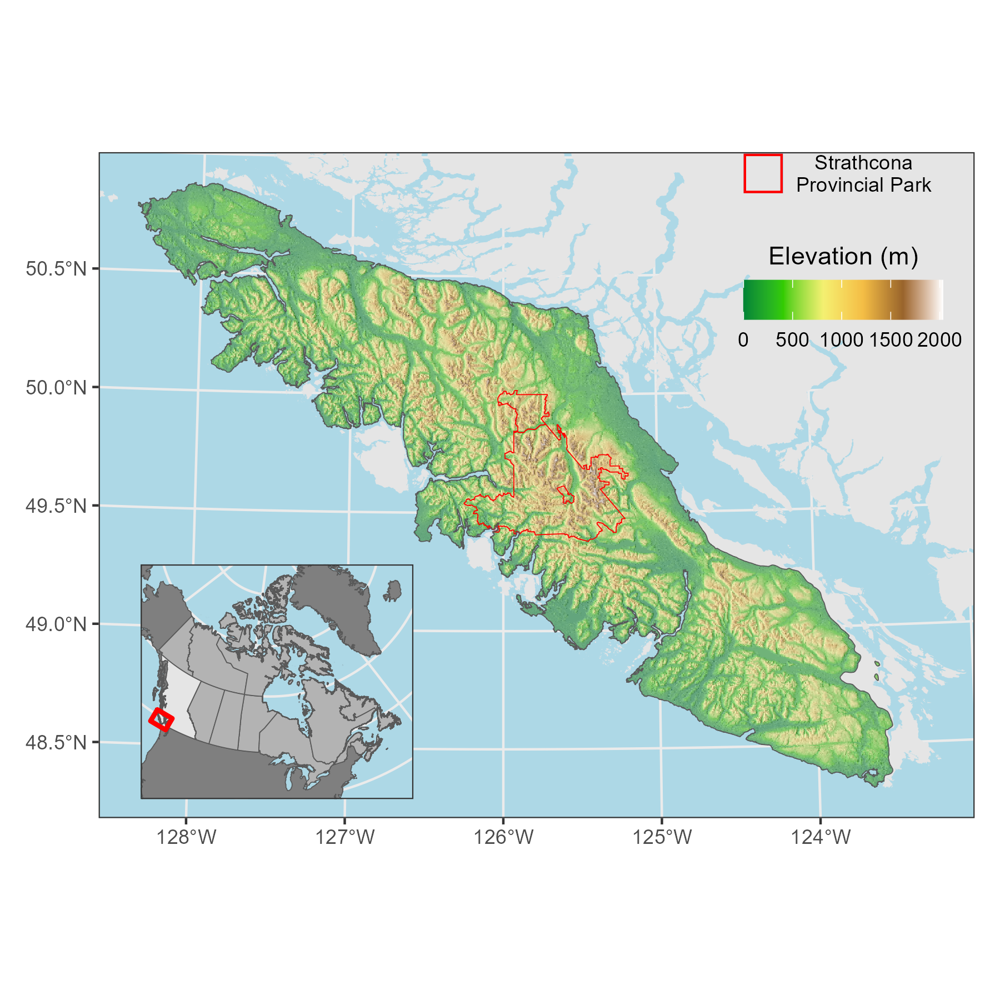

In [ ]:
knitr::include_graphics("E:/Sync/Masters/04_vi_pristine/figures/study_area.png")

## Data

### Forest Structure

Forest structure data were derived from the 30-m spatial resolution, wall-to-wall layers generated by Matasci et al. \[-@matasci2018; -@matasci2018a\] for the year 2015 using a random forest-kNN approach that imputed lidar-derived forest structural attributes across Canada’s forested ecosystems. We chose the year 2015 as this data is freely available at <https://opendata.nfis.org/mapserver/nfis-change_eng.html>. This methodology used Landsat-derived best-available-pixel composites representing growing season conditions \[@hermosilla2016; @white2014\], forest change information \[@hermosilla2015\], and topographic and positional information as predictors to impute forest structural attributes by finding the most similar lidar plot within the set of random forest trees. All forest structural attributes were assigned at once, preserving the covariance in the response variables and prohibiting overextrapolation. Accuracy metrics for the forest structural attributes ranged from an RMSE of 29.7% (structural complexity) to 65.8% (aboveground biomass) and R<sup>2</sup> values of 0.70 (aboveground biomass) to 0.13 (structural complexity) \[@matasci2018; @matasci2018a\].

### Forest Function

To represent forest ecosystem function, we used the Dynamic Habitat Indices (DHIs) dataset, which comprise a suite of intra-annual summaries of energy availability (as represented by a vegetation index or estimate of gross/net primary productivity) \[@radeloff2019\]. The DHIs are composed of the total available energy over the course of a year (Cumulative DHI), the minimum amount of energy available over the course of a year (Minimum DHI), and the variation in energy available over the course of a year (Variation DHI). The DHIs were calculated at a 30-m spatial resolution using Landsat data, following the methodology of @razenkova2023. The DHIs were computed on Google Earth Engine \[@gorelick2017\] by creating a synthetic year of monthly NDVI composites using all available Landsat imagery from 2011-2020 (centred on 2015 to match the forest structural attribute data). We used the Landsat QA band \[@zhu2012\] to filter pixels with clouds and cloud shadows. Monthly NDVI values were calculated by taking the median of each month’s NDVI observations, ignoring the year the image was acquired to increase the number of available images. The DHIs are calculated as the sum (Cumulative DHI), minimum (Minimum DHI), and coefficient of variation (Variation DHI) of these monthly observations.

### Anthropogenic Pressures

We used the Canadian Human Footprint as developed by @hirsh-pearson2022 to inform on anthropogenic pressures on the environment. The Canadian Human Footprint is an additive pressure map generated by summing the 12 different anthropogenic pressures (built environments, crop land, pasture land, population density, nighttime lights, railways, roads, navigable waterways, dams and associated reservoirs, mining activity, oil and gas, and forestry), which ranges from zero (lowest pressure) to 55 (highest pressure) across Canada. This cumulative dataset is also distributed with Canada-wide individual pressure values \[@hirsh-pearson2022\].

### Disturbance Mask

We use a forest disturbance mask to remove recently disturbed (since 1984) pixels from our reference states, developed by @hermosilla2016, by using breakpoint analysis on normalized burn ratio values derived from annual summer season growing condition best-available-pixel composites \[@white2014; @hermosilla2015a\]. Detected changes were attributed to a disturbance agent (harvest, wildfire, non-stand replacing disturbances) using a random forest approach, resulting in an overall accuracy of 92% ± 1.4% \[@hermosilla2016\].

### Forest Cover Mask

We used a land cover mask developed by Hermosilla et al. \[-@hermosilla2018; -@hermosilla2022a\] to mask out non-forested areas from our analysis. This land cover mask was developed by applying regional random forest models with an inverse-distance-weighted approach and refined and calibrated predictor data to identify 12 land cover classes, of which four are forested: coniferous, broadleaf, mixed wood, and wetland-treed \[@hermosilla2022a\]. Overall accuracy was 77.9% ± 1.4% across Canada \[@hermosilla2022a\].

### Topographic and climate data

We use a 30-m digital elevation model and derived slope dataset from the Advanced Spaceborne Thermal Emission and Reflection Radiometer (ASTER) Version 3 GDEM product \[@abrams2020\].

Climate variables: mean annual precipitation (MAP), mean annual temperature (MAT), mean warmest month temperature (MWMT), and mean coldest month temperature (MCMT) were calculated from 1990-2020 climate normals using the ClimateNA software package at a 1 km spatial resolution, and downsampled to 30-m using cubic spline resampling in the **terra** (version 1.7-71) R package \[@R-terra\] in R \[@R-base version 4.4.1\]. A visualization of one of each input dataset can be found in @fig-data.

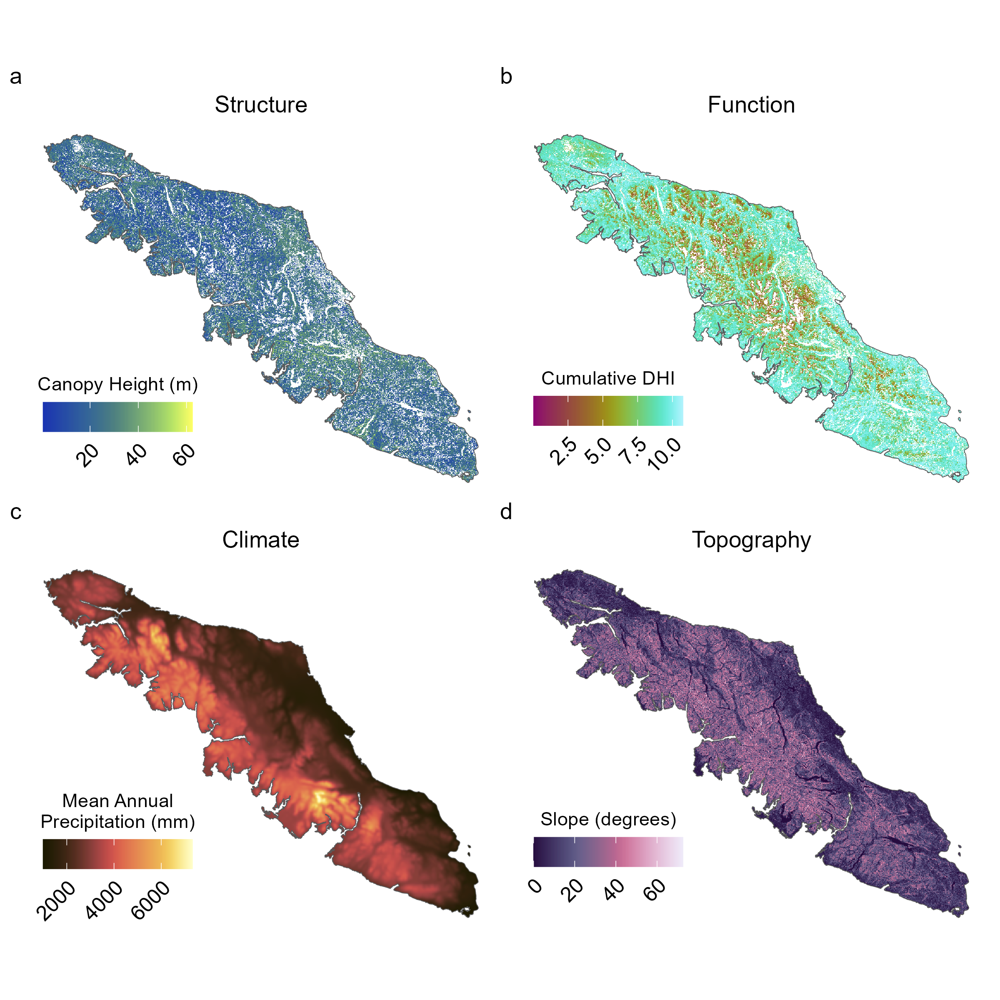

In [ ]:
knitr::include_graphics("E:/Sync/Masters/04_vi_pristine/figures/data_figure.png")

## Metrics

We utilized four forest structural attributes generated by Matasci et al. \[-@matasci2018; -@matasci2018a\]: canopy height (95th percentile of elevation returns), canopy cover (percentage of first returns above 2m), structural complexity (coefficient of variation of elevation returns), and aboveground biomass. Canopy height, canopy cover, structural complexity are standardized lidar-derived metrics suitable for biodiversity monitoring at the ecosystem scale \[@valbuena2020\]. The fourth attribute, aboveground biomass, represents the key ecosystem service of carbon sequestration \[@naidoo2006\], and is likely moderated by the three lidar-derived variables \[@ali2019\].

For the forest function metrics, we used the Cumulative and Variation DHIs. We did not use the minimum DHI, which was consistently 0, due to the presence of snow during winter in our study area. The DHIs have been shown to be indicative of ecosystem functioning, as they represent energy availability and seasonality \[@berry2007\], which is correlated with biodiversity over a range of scales \[@radeloff2019; @razenkova2022\], extents \[@coops2019; @coops2009ecoinfo\] and taxa \[@andrew2024; @coops2019\].

## Calculating Ecological Dissimilarity

We calculated the sigma dissimilarity \[@mahony2017\] of forested pixels across our study area using an expanded coarsened exact matching (CEM) technique \[@iacus2012\] for each forest type: broadleaf, coniferous, mixedwood, and wetland-treed \[@hermosilla2018; @hermosilla2022a\]. The CEM technique creates comparable groups of observations by first coarsening covariates into bins. In this study, all six covariates—elevation, slope, mean annual precipitation (MAP), mean annual temperature (MAT), mean coldest month temperature (MCMT), and mean warmest month temperature (MWMT)—were coarsened into five equally sized quintiles (bins). CEM then performs exact matching on these bins, with each pixel matched to a climatically and topographically similar group of pixels within the reference state (Strathcona Park). We use the anthropogenic pressure layers to further refine our reference state by excluding pixels with any amount of anthropogenic pressure in Strathcona Park, and also removed pixels disturbed since 1984 from the reference state. These matched groups are referred to as strata. If insufficient reference state pixels were identified within a stratum, we sampled up to 100 pixels from the nearest neighbours across climate and topographic bins, minimizing the nearest neighbour distance. Strata with average nearest neighbour distances greater than or equal to two were excluded from the analysis as they did not have an environmentally similar reference state to compare to.

We then calculated the sigma dissimilarity metric to assess the dissimilarity of all pixels—based on structural, functional, and combined structural and functional attributes—relative to the reference states. We first transformed the variables into principal components, and calculated the euclidean distance from the reference states mean centroid for all pixels, by stratum. This is also called the Mahalanobis distance, and accounts for covariations in the data \[@mahalanobis1936generalized\]. We then convert the Mahalanobis distance into sigma dissimilarity by rescaling it into percentiles of the chi distribution with one degree of freedom, accounting for the effect of dimensionality in creating a multivariate dissimilarity metric \[@mahony2017\]. This metric serves as a proxy for ecological integrity, with higher values indicating greater deviation from near-natural conditions observed in the reference state.

## Impact of Anthropogenic Pressure on Ecological Dissimilarity

Here, we assessed the impact of the cumulative pressure map and four individual pressures: population density, built environments, roads, and forestry. We selected these four as other pressures (oil and gas; railroads) are not present on Vancouver Island, while pasture land and crop land do not coincide with currently forested areas. We reclassify the overall Canadian Human Footprint \[@hirsh-pearson2022\] and individual pressures into categorical data following @hirsh-pearson2022 and @arias-patino2024: a value of zero is considered intact, zero to four has low anthropogenic pressure, four to eight has medium anthropogenic pressure, and above eight has high anthropogenic pressure.

To assess the cumulative impact of anthropogenic pressure on ecological dissimilarity, we implemented stratified sampling on all suitable stratum, sampling 100 pixels from each anthropogenic pressure class with a minimum distance between samples of 1000 m. For our individual pressures, we sampled an additional 100 pixels for each pressure class with a minimum distance between samples of 1000 m. Sampling was performed using the **sgsR** (version 1.4.5) R package \[@goodbody2023\] with the Quiennec method. The Quiennec method ensures that samples are drawn from regions surrounded by identical values, meaning no edge pixels are selected \[@queinnec2021\]. Geospatial data processing was performed using the **terra** (version 1.7-78) \[@R-terra\] and **sf** (version 1.0-16) \[@sf2018\] R packages.

We used a one-way analysis of variance (ANOVA) with a critical p-value of 0.05 to identify statistically significant differences in the mean similarity values across cumulative anthropogenic pressure classes. We accounted for family-wise error rate in our ANOVAs using the Holm-Bonferroni method \[@holm1979\], only continuing the analysis for similarity variables with significant ANOVAs at the adjusted critical value. We used a Tukey HSD post-hoc test to identify which means are different from the control group (intact pixels), which also controls for the family-wise error rate.

The difference in means for each anthropogenic pressure of interest (roads, population density, forestry, and built environment) were identified following the same protocol. We compared each pressure to the same ‘no pressure’ values sampled in the cumulative pressure analysis. All statistical analysis were conducted using the **rstatix** (version 0.7.2) R package \[@R-rstatix\].

# Results

We generated maps of sigma dissimilarity for ecosystem structure, function, and combined structure and function over the study area in Vancouver Island as a measure of ecological integrity (@fig-regional). Three representative examples to display the impact of anthropogenic pressures on ecosystem similarity are shown: a region near Lake Cowichan where harvesting is a common pressure (@fig-regional A), a protected area (Elk Falls Provincial Park) near Campbell River with high population density (@fig-regional B), and a region with lower anthropogenic pressures (@fig-regional C). Functional dissimilarity shows higher variation across all three sites than functional or combined structural and functional dissimilarity. The protected region near Campbell River (@fig-regional B) has lower dissimilarity metrics for all three metrics.

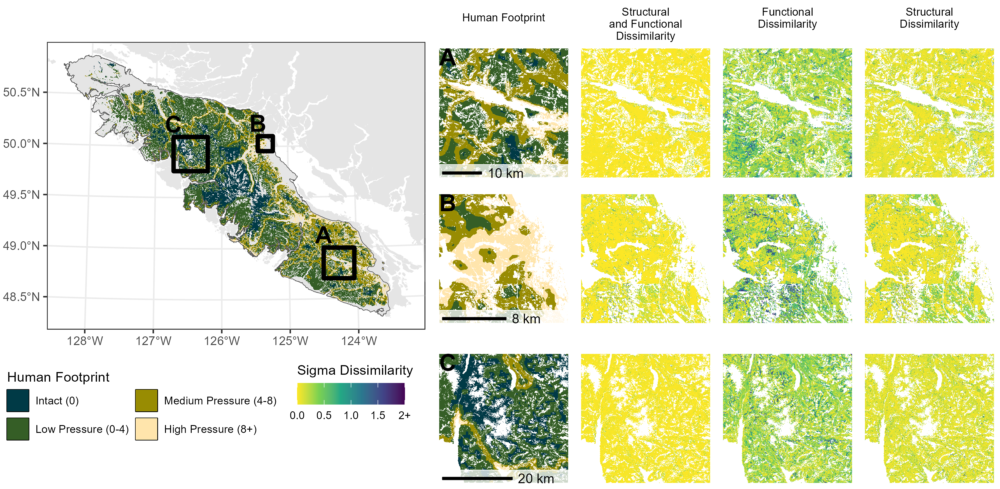

In [ ]:
knitr::include_graphics("E:/Sync/Masters/04_vi_pristine/figures/multi_panel_inset_wide_PS.png")

Results on the influence of the cumulative human footprint on ecological dissimilarity indicate that mean structural (ANOVA; p = 0.014) and combined structural and functional (ANOVA; p = 0.006) dissimilarity was significantly different under varying anthropogenic pressures (@fig-boxplot-overall). We found no evidence that the functional dissimilarity metric significantly varied with anthropogenic pressures. The Tukey HSD test revealed that high levels of anthropogenic pressures significantly influenced dissimilarity to the structural reference state, increasing from 0.11 to 0.24 (ANOVA; p \< 0.01), and to the combined structural and functional reference state, increasing from 0.02 to 0.07 (ANOVA; p \< 0.05). Medium and low levels of anthropogenic pressures did not significantly influence any dissimilarity

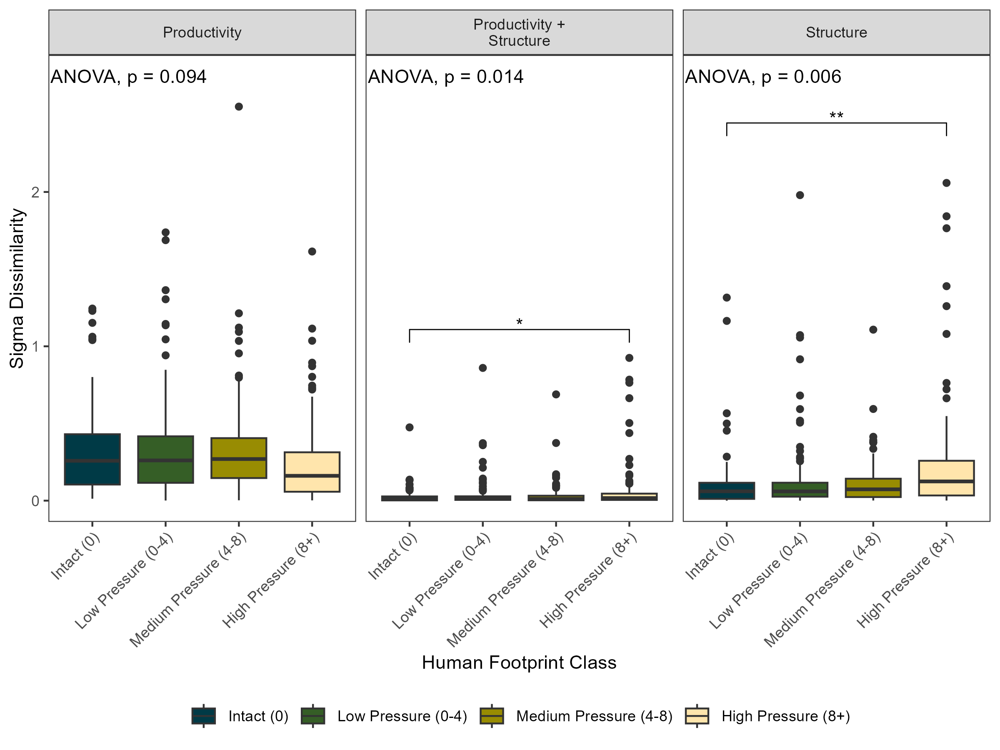

In [ ]:
knitr::include_graphics("E:/Sync/Masters/04_vi_pristine/figures/mahal_boxplot_sig.png")

The assessment of the impact of individual pressures on ecological dissimilarity to the reference state (@fig-boxplot-individual) indicated that functional dissimilarity was not significantly influenced by any anthropogenic pressures, and that roads did not influence any type of ecological dissimilarity (ANOVAs; all p \> 0.05). Population density, forestry and harvesting, and built environments did significantly increase both structural and combined structural and functional dissimilarity (ANOVAs; all p \< 0.01). Only the highest levels of pressures for each anthropogenic pressure category significantly influenced ecological dissimilarity (ANOVAs; all p \< 0.01).

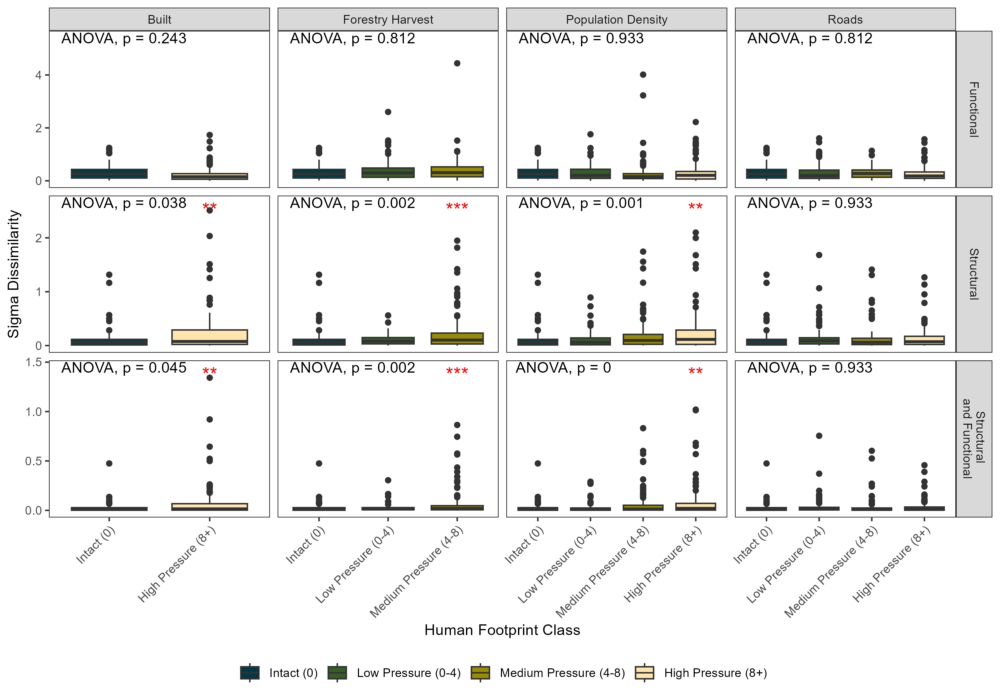

In [ ]:
knitr::include_graphics("E:/Sync/Masters/04_vi_pristine/figures/indiv_boxplots.png")

# Discussion

There is a growing need to move beyond area-based approaches to conservation. The GBF proposes to protected 30% of all ecosystems by 2030, emphasizing the preservation of high-integrity ecosystems \[@reporto2023; @ferrier2024\]. However, data and approaches for delineating high-integrity ecosystems are currently lacking. In this study, we developed a novel, data-driven framework to assess ecological integrity in forested landscapes, using coarsened exact matching \[@iacus2012\] to establish robust reference states and sigma dissimilarity metrics \[@mahony2017\] to quantify structural and functional deviations from these high-integrity conditions. The approach was demonstrated using forested areas on Vancouver Island, with Strathcona Park serving as the reference state due to its environmental similarity to the study area. Results indicate that high levels of anthropogenic pressure significantly increase structural and combined structural and functional dissimilarity, highlighting a reduction in ecological integrity (@fig-boxplot-overall). In contrast, functional dissimilarity remained unaffected by anthropogenic pressures, potentially indicating a decoupling between forest structure and annual energy availability \[@muise2024\], even under varying levels of anthropogenic pressure. Our results provide a scalable method for mapping forest ecological integrity, offering valuable insights for conservation planning, protected area management, and impact assessments beyond the study area.

## Strengths and Limitations for a Data-Driven Approach to Assessing Forest Integrity

Our methodology offers several advantages in assessing ecological integrity at regional and national scales, including a lack of information on high quality reference states, the ability to incorporate and compare across multiple indicators of ecological integrity, and the transferability of the methods. By leveraging a robust, data-driven reference state derived from a large, long-established protected area, we ensure that comparisons are made against ecologically intact ecosystems that are both attainable and environmentally consistent with areas being evaluated \[@mcnellie2020\]. The use of the sigma dissimilarity metric allows for a more nuanced evaluation of ecological integrity by accounting for covariations in the data and adapting to varying dimensionality in input datasets \[@mahony2017\], reducing biases associated with univariate assessments. Additionally, our approach enhances environmental consistency by employing an expanded coarsened exact matching technique \[@iacus2012\], which preserves environmental comparability between reference states and assessed forests. These methodological advancements improve the transferability of ecological integrity assessments across different forested ecosystems, providing a scalable and adaptable framework for conservation planning.

Our structural dissimilarity metric offers a flexible, data-driven alternative to traditional forest integrity assessments, enhancing its applicability across diverse ecosystems. Unlike threshold-based approaches, which often require predefined benchmarks for structural integrity \[@hansen2019\], our method uses sigma dissimilarity to the reference state to quantify ecological integrity in a multivariate and context-specific manner. This adaptability makes our framework more transferable to different forested ecosystems, as it does not assume a fixed structural composition but instead evaluates integrity based on the relative similarity to a high-integrity reference state, following the definition of ecological integrity \[@hansen2021\]. By integrating both structural and functional dimensions, our methodology allows for a broader applicability beyond temperate or tropical forests, making it a valuable tool for conservation planning across diverse forested regions.

Often, impact evaluation methods applied to conservation systems seek to determine the system wide differences between protected and unprotected areas, which are often reported as a single value \[@geldmann2019; @ferraro2009\]. Here, by integrating matching techniques with a multidimensional dissimilarity metric, we can generate spatially-explicit maps of ecological dissimilarity, providing insight beyond the overall difference between protected and unprotected areas. This gives a more comprehensive understanding of protected area effectiveness, and can allow for improved prioritization of conservation resources and allows for the analysis of ecological integrity with other datasets, such as the human footprint \[@hirsh-pearson2022; @arias-patino2024\].

Our methodology provides a versatile framework for conservation and habitat assessments, with applications extending beyond Vancouver Island’s forested ecosystems. For example, this framework can be applied to identify high-quality habitat for species with specific structural requirements, such as the marbled murrelet (*Brachyramphus marmoratus*), which relies on old-growth forests with tall, complex canopies for nesting \[@cosgrove2024\]. Additionally, the ability to quantify ecological dissimilarity across landscapes enables its use in protected area prioritization, landscape connectivity analysis, and ecological restoration planning. As global conservation efforts, such as the 30x30 goal, emphasize the need for protecting high-integrity ecosystems \[@reporto2023\], our approach offers a scalable and transferable tool for identifying and managing critical conservation areas.

A key challenge in applying our methodology lies in selecting an appropriate reference state, which is integral for accurately measuring ecological integrity. The selection of an appropriate reference state is critical, as the ecological integrity of assessed forests is measured relative to this benchmark \[@mcnellie2020\]. While our use of a large, long-established protected area ensures minimal anthropogenic influence, differences in environmental conditions between the reference and assessed areas could introduce variability, especially in cases where no perfect match is found. We could potentially include additional areas as reference states to reduce the number of imperfect or unavailable matches, however, nearly all of the protected areas on Vancouver Island do not meet our large and long-established criterion. Thus, there are tradeoffs to be considered when expanding the reference state to additional newer or smaller parks.

## Ecological Integrity and Anthropogenic Pressures on Vancouver Island

Our results indicate that high levels of cumulative anthropogenic pressure led to increased structural dissimilarity, demonstrating a small but significant decline in forest ecological integrity (@fig-boxplot-overall). This aligns with previous studies that have identified structural degradation under anthropogenic influence \[@li2023; @bourgoin2024\], though our approach extends these findings by applying a multivariate dissimilarity metric rather than relying on singular structural indicators such as canopy height or biomass. The observed structural dissimilarity suggests that human activities are altering forest structure, reducing its resemblance to high-integrity reference states. These results highlight the need for conservation strategies that mitigate structural degradation, particularly in regions experiencing increasing human pressures.

Examining the impact of individual anthropogenic pressures on forest structure revealed varying effects, with most pressures contributing to increased structural dissimilarity (@fig-boxplot-individual). However, roads did not significantly impact structural dissimilarity, contrasting with other pressures such as built environments, harvesting, and population density, which all led to measurable increases in structural dissimilarity. These results suggests that while roads can fragment landscapes and alter connectivity, their direct influence on stand-level forest structure may be less pronounced compared to land-uses that actively modify vegetation composition and density \[@wulder2011; @bourgoin2024\]. Our findings emphasize the importance of considering individual pressure types rather than relying solely on cumulative impact metrics, as different pressures may drive ecological degradation through distinct mechanisms. These individual component results also contribute to discussions around anthropogenic pressure mapping methods, as there is little information on the mechanistic interactions between anthropogenic pressures \[@arias-patino2024\].

In contrast to structural dissimilarity, functional dissimilarity exhibited stronger spatial variation (@fig-regional) but was not significantly influenced by cumulative or individual anthropogenic pressures (@fig-boxplot-overall ; @fig-boxplot-individual). This suggests that functional attributes of forests, such as productivity and seasonal dynamics, may be more resilient to direct human pressures than structural characteristics. While prior research has linked anthropogenic forest degradation to changes in canopy function \[@bourgoin2024\], our findings indicate that in temperate ecosystems with consistently high canopy cover, such as Vancouver Island, functional metrics may not be strongly linked to anthropogenic pressures. These results highlight the complexity of ecosystem functioning and suggest that factors beyond anthropogenic pressure, such as climate variability and natural disturbance regimes, may play a dominant role in shaping functional integrity.

Several factors may explain the lack of a significant anthropogenic influence on functional dissimilarity. NDVI-based functional metrics, such as the DHIs, are known to saturate in forests with high canopy cover and leaf area index \[@huete2002\], which are prevalent in our study area \[@muise2024\]. Additionally, Vancouver Island’s temperate climate and dominance of coniferous forests may result in relatively stable seasonal energy availability compared to ecosystems with stronger seasonality, such as tropical or deciduous forests. The low functional response to anthropogenic pressures observed in our study suggests that alternative functional indicators, such as phenospectral metrics \[@oseidarko2024\] or multi-spectral indices beyond NDVI, may be needed to better capture human-induced functional changes in forested landscapes. Future research should explore alternative functional metrics that are less prone to saturation, particularly in ecosystems with dense, evergreen canopies like those on Vancouver Island.

# Conclusion

As the international community moves toward the goal of protecting 30% of high-integrity ecosystems by 2030, it is critical to identify the location of such ecosystems. However, identifying high-integrity forests at the national or regional scales is difficult due to a lack of comprehensive spatial data on high-integrity ecosystems and varying definitions of what constitutes a high-integrity forest. In this study, we propose a novel, data-driven framework to assess ecological integrity in forested ecosystems. The methodology integrates a robust technique for generating suitable reference states through the use of a large, long-term protected area, and by excluding any pressures and disturbances. Ecological integrity is estimated as dissimilarity to the reference state by using the sigma dissimilarity metric, which accounts for covariations in the data and varying dimensionality in input datasets. We demonstrate our methodology on forested areas of Vancouver Island which are environmentally similar to the reference state, Strathcona Park. Furthermore, we assess the impact of anthropogenic pressures on our metric, revealing that high levels of anthropogenic pressures increase structural and combined structural and functional dissimilarity, indicating a decline in ecological integrity. However, it is notable that functional dissimilarity remained unaffected by anthropogenic pressures. The findings from this study offer significant insights that can be leveraged to enhance conservation planning efforts by providing a scalable, data-driven approach to identifying high-integrity forests. The potential of this framework to support evidence-based decision-making in conservation science is considerable Additionally, this methodology can be adapted for use in other regions, aiding global efforts to meet the 30x30 conservation targets and address complex environmental challenges in the face of increasing human pressures \[@reporto2023\].

# Acknowledgements

This research was funded by NSERC support of Coops (RGPIN-2024-04402). Remote sensing data products used in this research are free and open and available for download at <https://ca.nfis.org/maps_eng.html>. The authors thank Dr. Michael A. Wulder and Dr. Joanne C. White for development and early access to these National Terrestrial Ecosystem Mapping System (NTEMS) products. They thank Dr. Elena Razenkova for early access to the Landsat-derived Dynamic Habitat Indices.

# Ethics

The authors declare no conflicts of interest.

# References